# Введение в машинное обучение, АБД

## НИУ ВШЭ, 2025-26 учебный год

# Домашнее задание 1. Часть 2. Регрессия и инференс модели

Задание выполнил(а):

Явнова Софья

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
*  реализовать веб-сервис для применения построенной модели на новых данных

> Оценка за домашнее задание = $min(\text{ваш балл}, 33)$

## Общая информация

__Внимание!__  

* Домашнее задание выполняется самостоятельно
* Не допускается помощь в решении домашнего задания от однокурсников или третьих лиц. «Похожие» решения считаются плагиатом, и все задействованные студенты — в том числе и те, у кого списали, — не могут получить за него больше 0 баллов
* Использование в решении домашнего задания за рамками справочной и образовательной информации генеративных моделей (ChatGPT и так далее) для генерации кода задания считается плагиатом, и такое домашнее задание оценивается в 0 баллов

**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов или все баллы за соответствующее задание снимается.

## Импорт библиотек, установка констант

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

In [3]:
CARS_TRAIN = 'https://github.com/evgpat/datasets/raw/refs/heads/main/cars_train.csv'
CARS_TEST = 'https://github.com/evgpat/datasets/raw/refs/heads/main/cars_test.csv'

In [4]:
RANDOM_STATE = 42

In [5]:
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)

## Задание 0

Для чего фиксируем сиды в ноутбуке?

Фиксация случаных результатов. Что бы при перезапуске кода каждый раз выдавался одинаковый результат.


## Часть 1 | EDA




Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков
- Визуализации признаков и их анализ

В следующих частях вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (4.5 балла)**

In [6]:
%%capture
!pip install ydata-profiling
from ydata_profiling import ProfileReport

In [7]:
df_train = pd.read_csv(CARS_TRAIN)
df_test = pd.read_csv(CARS_TEST)

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(1.2 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling) (0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла)

In [8]:
#пустые колонки train
train_nan = df_train.columns[df_train.isna().any()].tolist()
print("Колонки с пропусками в датасете train:", train_nan)

#дубликаты train
train_duplets= df_train.duplicated().sum()
print("Количество дубликатов в датасете train:", train_duplets)


#пустые колонки test
test_nan = df_test.columns[df_train.isna().any()].tolist()
print("Колонки с пропусками в датасете test:", test_nan)

#дубликаты test
test_duplets= df_test.duplicated().sum()
print("Количество явных дубликатов в датасете test:", test_duplets)

Колонки с пропусками в датасете train: ['mileage', 'engine', 'max_power', 'torque', 'seats']
Количество дубликатов в датасете train: 985
Колонки с пропусками в датасете test: ['mileage', 'engine', 'max_power', 'torque', 'seats']
Количество явных дубликатов в датасете test: 62


In [ ]:
#  дашборд train
ProfileReport(df_train, title="Cars Data Report").to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 23.64it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#  дашборд test
ProfileReport(df_test, title="Cars Data Report").to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 37.26it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Выводы:
В обоих датасетах пропущенные значения встречаются в колонках : mileage, engine, max_power, torque, seats.
Большинство автомобилей продаются перым владельцем машины.
98% предсьавленных автомобилей работают на дизеле и бензине.


### **Задание 2 (0.6 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [13]:
# your code here
print('Числовые статистики датасета трейн:\n', df_train.describe())
print('Числовые статистики датасета тест:\n' , df_test.describe())

Числовые статистики датасета трейн:
               year  selling_price     km_driven        seats
count  6999.000000   6.999000e+03  6.999000e+03  6797.000000
mean   2013.818403   6.395152e+05  6.958462e+04     5.419008
std       4.053095   8.089419e+05  5.772400e+04     0.965767
min    1983.000000   2.999900e+04  1.000000e+00     2.000000
25%    2011.000000   2.549990e+05  3.500000e+04     5.000000
50%    2015.000000   4.500000e+05  6.000000e+04     5.000000
75%    2017.000000   6.750000e+05  9.700000e+04     5.000000
max    2020.000000   1.000000e+07  2.360457e+06    14.000000
Числовые статистики датасета тест:
               year  selling_price      km_driven       seats
count  1000.000000   1.000000e+03    1000.000000  981.000000
mean   2013.681000   6.179010e+05   71393.341000    5.410805
std       4.012149   7.585539e+05   48486.218662    0.919985
min    1995.000000   3.100000e+04    1303.000000    4.000000
25%    2011.000000   2.500000e+05   37000.000000    5.000000
50%    2014.

In [14]:

print('Категориальные статистики датасета трейн:\n', df_train.describe(include=["object", "category"]))
print('Категориальные статистики датасета тест:\n' , df_test.describe(include=["object", "category"]))

Категориальные статистики датасета трейн:
                           name    fuel seller_type transmission        owner  \
count                     6999    6999        6999         6999         6999   
unique                    1924       4           3            2            5   
top     Maruti Swift Dzire VDI  Diesel  Individual       Manual  First Owner   
freq                       116    3793        5826         6095         4587   

          mileage   engine max_power          torque  
count        6797     6797      6803            6796  
unique        386      120       316             419  
top     18.9 kmpl  1248 CC    74 bhp  190Nm@ 2000rpm  
freq          197      885       330             468  
Категориальные статистики датасета тест:
                        name    fuel seller_type transmission        owner  \
count                  1000    1000        1000         1000         1000   
unique                  621       4           3            2            5   
top     

Вывод:
В целом показатели между train и test не имеют сильных отличий. Это означает, что разбитие данных на train и test корректно отражает полный датасет.

selling_price и km_driven: Среднее сильно выше медианы в обоих датасетах. Это может указывать на то, что в авто бюджетного класса с малыи пробегом преобладают на рынке. .

year: Среднее ниже медианы. Большинство машин новые 2014–2015 года , но некоторые старые авто (от 1983 года) снижают среднее знаечение.

seats: Медиана равна 5, стандартный набор мест для автою Среднее значение в 5,4 может быть из-за минивенов.


### **Задание 3 (0.6 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.05 балла)
- [ ] Отобразите такие объекты (0.05 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.05 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.05 балла)

In [9]:
df_train_wo_price = [col for col in df_train.columns if col != "selling_price"]
duplicates= df_train.duplicated(subset=df_train_wo_price, keep="first")
duplicates_count = duplicates.sum()
print("Количество объектов с одинаковым признаковым описанием:", {duplicates_count})

duplicates_view = df_train[df_train.duplicated(subset=df_train_wo_price, keep=False)].sort_values(by=df_train_wo_price)
duplicates_view.head(10)

Количество объектов с одинаковым признаковым описанием: {np.int64(1159)}


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
1703,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,15.73 kmpl,1968 CC,174.33 bhp,380Nm@ 1750-2500rpm,5.0
6307,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,15.73 kmpl,1968 CC,174.33 bhp,380Nm@ 1750-2500rpm,5.0
1836,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,13.22 kmpl,2967 CC,241.4 bhp,580Nm@ 1400-3250rpm,5.0
6704,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,13.22 kmpl,2967 CC,241.4 bhp,580Nm@ 1400-3250rpm,5.0
117,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
1337,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
1595,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
2787,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
4485,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
6640,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0


In [10]:
df_train = df_train.drop_duplicates(subset=df_train_wo_price, keep="first")
df_train = df_train.reset_index(drop=True)

In [11]:
assert df_train.shape == (5840, 13)

### **Задание 4 (0.6 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными, они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [12]:
# your code here

datasets = [df_train, df_test]
for df in datasets:
    df["mileage"] =(df["mileage"].astype(str).str.extract(r"(\d+\.?\d*)").astype(float))
    df["engine"] =(df["engine"].astype(str).str.extract(r"(\d+\.?\d*)").astype(float))
    df["max_power"] =(df["max_power"].astype(str).str.extract(r"(\d+\.?\d*)").astype(float))

    torque_str = ( df["torque"].astype(str).str.lower().str.replace(",", "")).replace("nan", np.nan)
    df["torque"] = torque_str.str.extract(r"(\d+\.?\d*)").astype(float)
    is_kgm = torque_str.str.contains("kgm", na=False)
    df.loc[is_kgm, "torque"] = df.loc[is_kgm, "torque"] * 9.80665
    rpm_extracted = torque_str.str.extract(r"(\d{3,4})(?:\s*rpm)?$|.*?(\d{3,4})\s*rpm")
    df["max_torque_rpm"] = (torque_str.str.extract(r".*?(?:^|\D)(\d{4})(?:\D|$)").astype(float)
    )

### **Задание 5 (0.6 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






In [15]:
# your code here

cols_with_nan = ["mileage", "engine", "max_power", "torque", "seats", "max_torque_rpm"]

for col in cols_with_nan:
    train_median = df_train[col].median()
    df_train[col] = df_train[col].fillna(train_median)
    df_test[col] = df_test[col].fillna(train_median)

Среднее значение некорретно выбирать для заполнения пропсуков, так как оно чувствительно к выбросам и ассиметриям.


Медиану считаем по тренировочным данным для train и test. Так как тестовый датасет должен быть изолирован до момента финального обучения модели.

### **Задание 6 (0.6 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [16]:
df_train["engine"] = df_train["engine"].astype(int)
df_test["seats"] = df_test["seats"].astype(int)

Признак может быть категориальным так как:
имеет ограниченый набор значений 2, 4, 5, 7, 8, 9, 14
показывает тип автомобиля: минивен, автобус, кепе и тд

### **Задание 7 (0.3 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [40]:
# your code here
print('Числовые статистики датасета трейн:\n', df_train.describe())
print('Числовые статистики датасета тест:\n' , df_test.describe())


print('Категориальные статистики датасета трейн:\n', df_train.describe(include=["object", "category"]))
print('Категориальные статистики датасета тест:\n' , df_test.describe(include=["object", "category"]))

Числовые статистики датасета трейн:
               year  selling_price     km_driven      mileage       engine  \
count  5840.000000   5.840000e+03  5.840000e+03  5840.000000  5840.000000   
mean   2013.428425   5.229601e+05  7.395224e+04    19.430841  1429.448973   
std       4.095622   5.354320e+05  6.007114e+04     3.985973   485.662834   
min    1983.000000   2.999900e+04  1.000000e+00     0.000000   624.000000   
25%    2011.000000   2.500000e+05  3.900000e+04    16.950000  1197.000000   
50%    2014.000000   4.050000e+05  7.000000e+04    19.370000  1248.000000   
75%    2017.000000   6.400000e+05  1.000000e+05    22.300000  1498.000000   
max    2020.000000   1.000000e+07  2.360457e+06    42.000000  3604.000000   

         max_power       torque        seats  max_torque_rpm  
count  5840.000000  5840.000000  5840.000000       68.000000  
mean     87.906371   175.930478     5.426712     4203.044118  
std      31.640418   116.757608     0.982344     2713.107776  
min       0.00000

Основные призаки mean,std и квартили почти не изменились.

Заполнения пропсуков могло сдвинуть распределения в следующих случаях:
*  Если количество пропсуков было слишком большим. Массовое дополение одинакового признака могло повляиеть на дисперсию
*  Если пропуски были неслучайные, например, если бы какие-то характеристики не указывались владельцами старых авто. В таком случае заоплнение пропусков моглол завысить их характеристики


## **Визуализации и корреляция (4.8 балла + 0.3)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (1.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

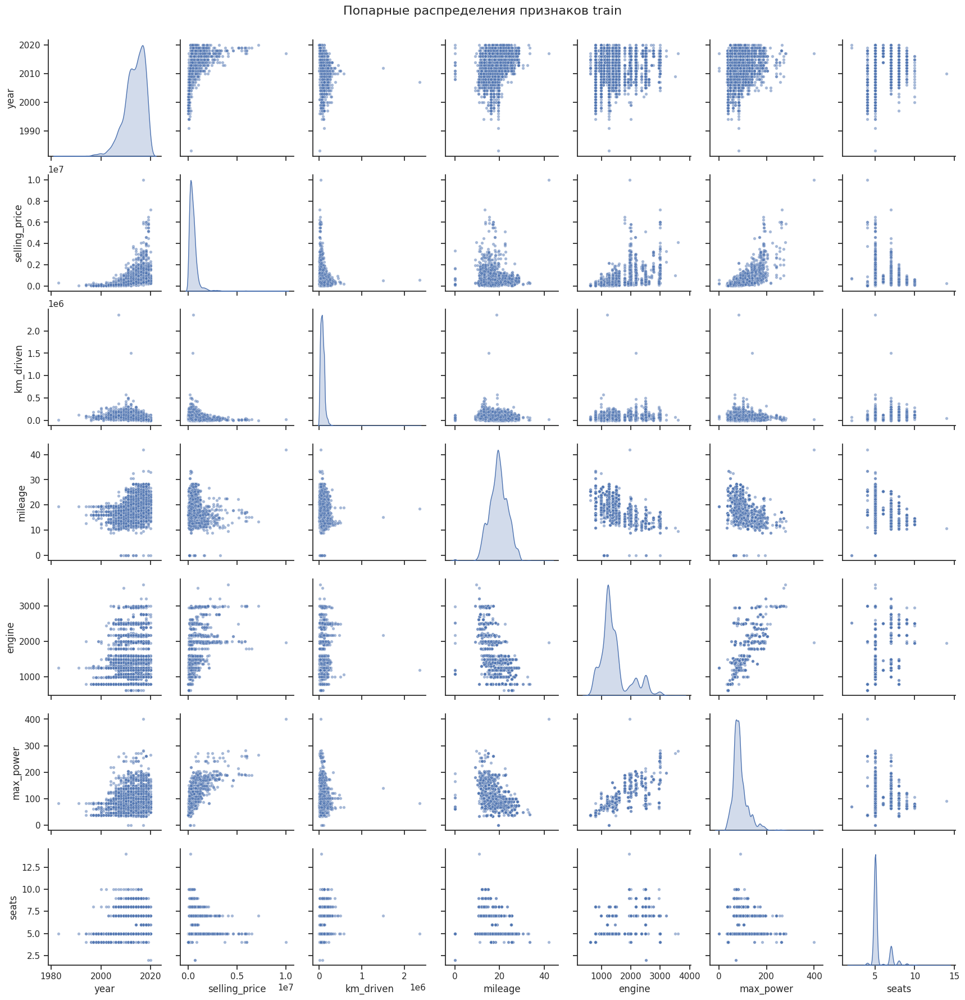

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

numeric_cols = [
    "year",
    "selling_price",
    "km_driven",
    "mileage",
    "engine",
    "max_power",
    "seats",
]

sns.set_theme(style="ticks")
pairplot_train = sns.pairplot(
    df_train[numeric_cols],
    diag_kind="kde",
    plot_kws={"alpha": 0.5, "s": 15},
)
plt.suptitle("Попарные распределения признаков train", y=1.02, fontsize=16)
plt.show()

Связь  с max_power и engine. С увеличением мощность и объема двигателя цена растет.
Связь year. чем новее автомобиль, выше цены на авто
Связь km_driven. автомобили с большим пробегом имеют низкую цену

Есть корреляция между engine и max_power. Чем больше объем двигателя, тем он мощнее.
Есть корреляция между year и km_driven. более старые машины  имеют больший пробег.

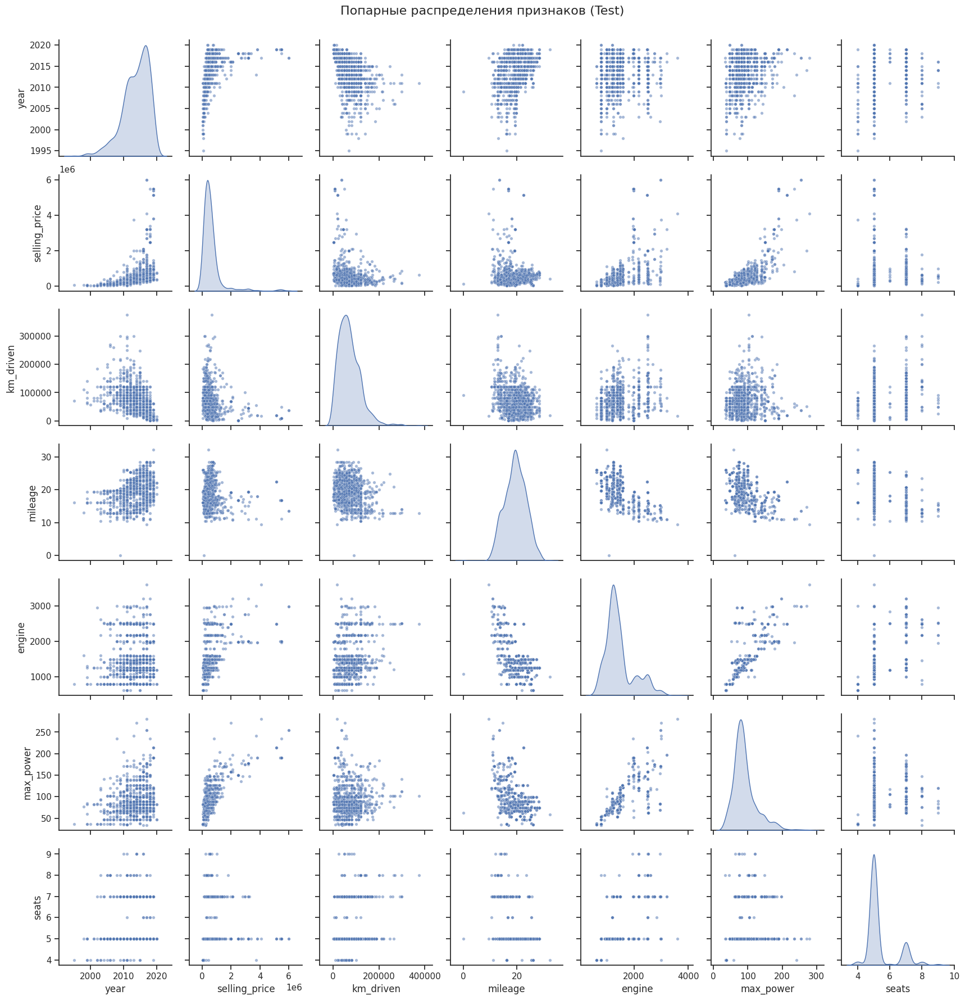

In [22]:
pairplot_test = sns.pairplot(
    df_test[numeric_cols],
    diag_kind="kde",
    plot_kws={"alpha": 0.5, "s": 15},
)
plt.suptitle("Попарные распределения признаков (Test)", y=1.02, fontsize=16)
plt.show()

Да, совокупности очень похожи.
Формы графиков плотности по главной диагоналии облака рассеяния точек для Test практически полностью повторяют контуры Train.


### **Задание 9 (1.5 балла)**

Итак, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

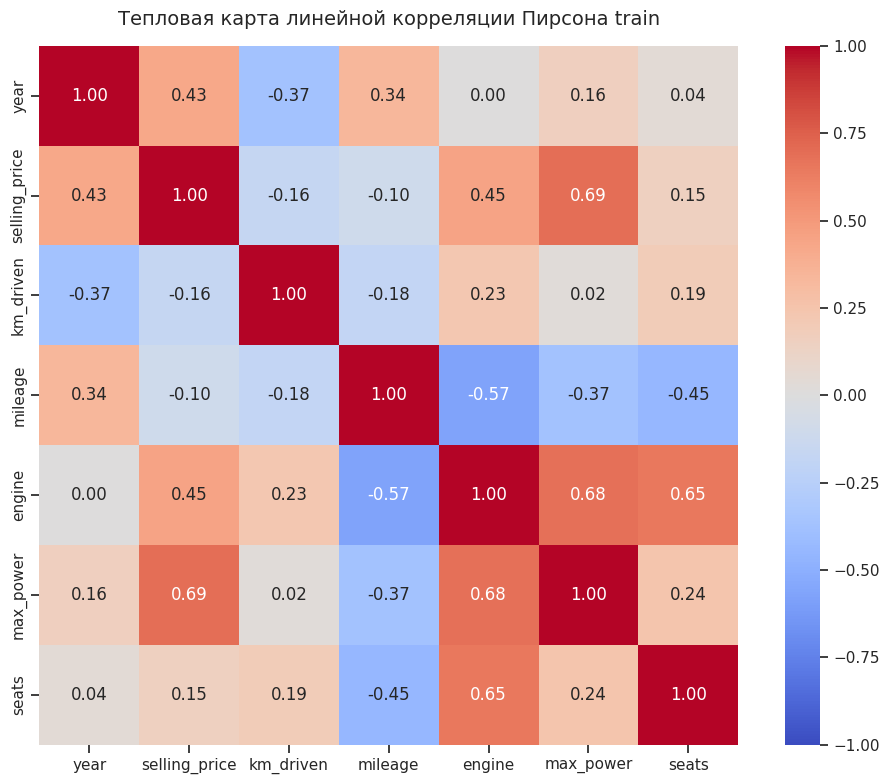

In [24]:
# your code here
corr_matrix = df_train[numeric_cols].corr(method="pearson")
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    square=True,
    vmin=-1,
    vmax=1,
)
plt.title(
    "Тепловая карта линейной корреляции Пирсона train", fontsize=14, pad=15
)
plt.tight_layout()
plt.show()

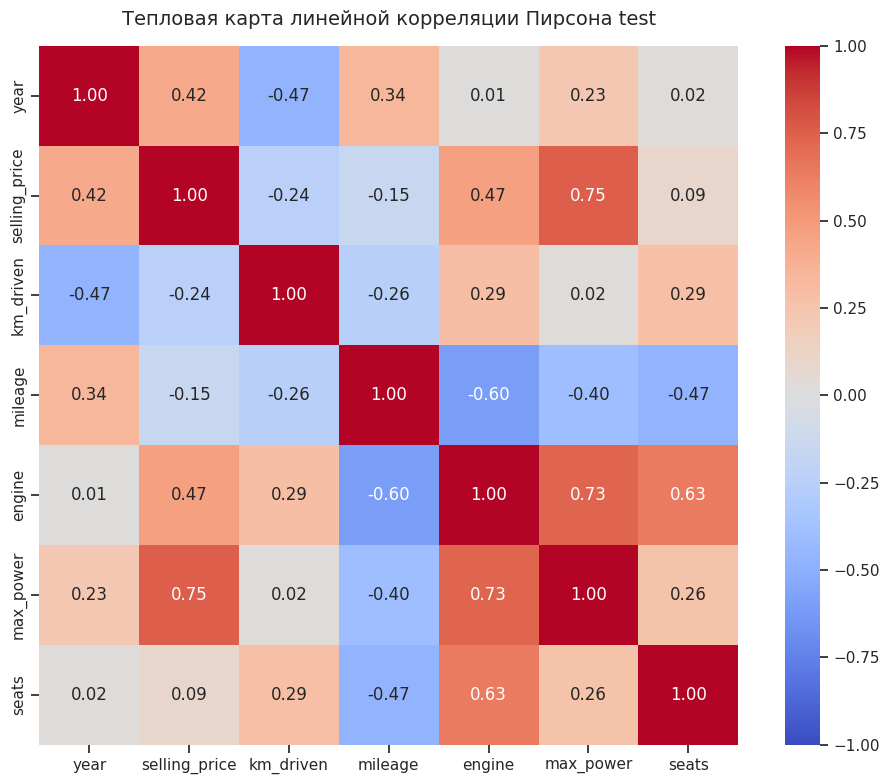

In [25]:
corr_matrix = df_test[numeric_cols].corr(method="pearson")
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    square=True,
    vmin=-1,
    vmax=1,
)
plt.title(
    "Тепловая карта линейной корреляции Пирсона test", fontsize=14, pad=15
)
plt.tight_layout()
plt.show()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

Наименьшая корреляция между engine и year.

Наибольшая корреляция между selling priceи и max power

Да, чем меньше год, тем меньше пробег машины, так как корреляция отрицательная


### **Задание 10 (1.8 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ]

Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


`Your answer here`

### **Дополнительные визуализации (0.3 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

In [ ]:
# your code here

# **Часть 2 (5.4 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.15 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [28]:
numeric_features = [
    "year",
    "km_driven",
    "mileage",
    "engine",
    "max_power",
    "torque",
    "seats",
    "max_torque_rpm",
]

y_train = df_train["selling_price"].copy()
X_train = df_train[numeric_features].copy()

In [29]:
assert X_train.shape == (5840, 8)

In [30]:
y_test = df_test["selling_price"].copy()
X_test = df_test[numeric_features].copy()

In [31]:
assert X_test.shape == (1000, 8)

### **Задание 12. (0.6 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [33]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

# your code here

lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

y_train_pred = lr_model.predict(X_train)
y_test_pred = lr_model.predict(X_test)

r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

mse_train = MSE(y_train, y_train_pred)
mse_test = MSE(y_test, y_test_pred)

print("Train R2:",  r2_train)
print("Test R2:",  r2_test)
print("Train MSE:",  mse_train)
print("Test MSE:",  mse_test)

Train R2: 0.6008833287510639
Test R2: 0.5974174683545519
Train MSE: 114402139457.72592
Test MSE: 231415935191.02124


R2 равен примерно 0.6 означает, что модель объясняет примерно 60% разброса цен на автомобиля.

Разница R2 train и test достаточно мала, это озночает, что модель не переобучена

MSE train и test значительно различаются. Это озночает, что в тестовой выборке есть выбросы (дорогие авто) к которому чувствительна метрика. Модель предсказывает уцену премиальных автомобилей с большой ошибкой



### **Задание 13 (0.45 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

In [35]:
# your code here

def custom_r2 (y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    ss_res = np.sum((y_true - y_pred) ** 2)
    y_mean = np.mean(y_true)
    ss_tot = np.sum((y_true - y_mean) ** 2)
    r2 = 1 - (ss_res / ss_tot)

    return r2

r2_train_custom = custom_r2(y_train, y_train_pred)
r2_test_custom = custom_r2(y_test, y_test_pred)

print(f"Ручной Train R2:", r2_train_custom)
print(f"Ручной Test R2:",  r2_test_custom)

Ручной Train R2: 0.6008833287510639
Ручной Test R2: 0.5974174683545519


`Your answer here`

### **Бонус (0.45 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [36]:
def custom_adjusted_r2(y_true, y_pred, X):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    ss_res = np.sum((y_true - y_pred) ** 2)
    ss_tot = np.sum((y_true - np.mean(y_true)) ** 2)
    r2 = 1 - (ss_res / ss_tot)
    n = X.shape[0]
    p = X.shape[1]
    adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
    return adjusted_r2

adj_r2_train = custom_adjusted_r2(y_train, y_train_pred, X_train)
adj_r2_test = custom_adjusted_r2(y_test, y_test_pred, X_test)

print(adj_r2_train)
print(adj_r2_test)


0.6003357497131645
0.5941675589164453


`Your answer here`

### **Задание 14 (0.45 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

Как изменилось качество модели?

In [37]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr_scaled = LinearRegression()
lr_scaled.fit(X_train_scaled, y_train)


y_train_pred_scaled = lr_scaled.predict(X_train_scaled)
y_test_pred_scaled = lr_scaled.predict(X_test_scaled)

print(f"Train R2:  {r2_score(y_train, y_train_pred_scaled):.4f}")
print(f"Test R2:   {r2_score(y_test, y_test_pred_scaled):.4f}")
print(f"Train MSE: {MSE(y_train, y_train_pred_scaled):.2f}")
print(f"Test MSE:  {MSE(y_test, y_test_pred_scaled):.2f}")

Train R2:  0.6009
Test R2:   0.5974
Train MSE: 114402139457.73
Test MSE:  231415935191.02


Качество модели после стандартизации не изменилось.



### **Задание 15 (0.3 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве, она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [38]:
for feature, weight in zip(numeric_features, lr_scaled.coef_):
    print(f"Признак: {feature:<15} | Вес (β): {weight:,.2f}")

Признак: year            | Вес (β): 163,723.95
Признак: km_driven       | Вес (β): -50,565.09
Признак: mileage         | Вес (β): -6,220.78
Признак: engine          | Вес (β): 16,228.26
Признак: max_power       | Вес (β): 324,197.73
Признак: torque          | Вес (β): -258.28
Признак: seats           | Вес (β): -33,179.60
Признак: max_torque_rpm  | Вес (β): -65,302.36


Признак Max_power оказался наиболее влияющем на цену авто


### **Задание 16 (0.75 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [39]:
from sklearn.linear_model import Lasso

lasso_model = Lasso(alpha=1.0, random_state=42)
lasso_model.fit(X_train_scaled, y_train)

y_train_pred_lasso = lasso_model.predict(X_train_scaled)
y_test_pred_lasso = lasso_model.predict(X_test_scaled)


print(f"Train R2:  {r2_score(y_train, y_train_pred_lasso):.4f}")
print(f"Test R2:   {r2_score(y_test, y_test_pred_lasso):.4f}")
print(f"Train MSE: {MSE(y_train, y_train_pred_lasso):.2f}")
print(f"Test MSE:  {MSE(y_test, y_test_pred_lasso):.2f}\n")

for feature, weight in zip(numeric_features, lasso_model.coef_):
    print(f"Признак: {feature:<15} | Вес (β): {weight:,.2f}")

Train R2:  0.6009
Test R2:   0.5974
Train MSE: 114402139475.18
Test MSE:  231416650681.55

Признак: year            | Вес (β): 163,722.20
Признак: km_driven       | Вес (β): -50,564.06
Признак: mileage         | Вес (β): -6,218.15
Признак: engine          | Вес (β): 16,225.81
Признак: max_power       | Вес (β): 324,197.45
Признак: torque          | Вес (β): -255.02
Признак: seats           | Вес (β): -33,175.82
Признак: max_torque_rpm  | Вес (β): -65,299.49


Ни один признак не был занулен из-за большого значения MSE и низкого коэффициента alpha

### **Задание 17. Финальный рывок (1.2 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c десятью фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [41]:
from sklearn.model_selection import GridSearchCV
param_grid = {"alpha": [0.1, 1, 10, 100, 500, 1000, 2000, 5000, 10000, 20000]}

lasso_cv = GridSearchCV(
    estimator=Lasso(random_state=42, max_iter=100000),
    param_grid=param_grid,
    cv=10,
    scoring="r2",
    n_jobs=-1,
)

lasso_cv.fit(X_train_scaled, y_train)

best_lasso = lasso_cv.best_estimator_
y_train_pred = best_lasso.predict(X_train_scaled)
y_test_pred = best_lasso.predict(X_test_scaled)

print(f"Лучший параметр alpha: {lasso_cv.best_params_['alpha']}")
print(f"Train R2:              {r2_score(y_train, y_train_pred):.4f}")
print(f"Test R2:               {r2_score(y_test, y_test_pred):.4f}")
print(f"Train MSE:             {MSE(y_train, y_train_pred):.2f}")
print(f"Test MSE:              {MSE(y_test, y_test_pred):.2f}\n")

for feature, weight in zip(numeric_features, best_lasso.coef_):
    print(f"Признак: {feature:<15} | Вес (β): {weight:,.2f}")

Лучший параметр alpha: 20000
Train R2:              0.5943
Test R2:               0.5734
Train MSE:             116296521667.47
Test MSE:              245243274354.32

Признак: year            | Вес (β): 147,995.08
Признак: km_driven       | Вес (β): -30,759.22
Признак: mileage         | Вес (β): 0.00
Признак: engine          | Вес (β): 0.00
Признак: max_power       | Вес (β): 318,690.06
Признак: torque          | Вес (β): 0.00
Признак: seats           | Вес (β): -0.00
Признак: max_torque_rpm  | Вес (β): -37,175.19


`Your answer here`

**Ваша задача 2:**

- [ ] Перебором по сетке (c десятью фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [ ]:
# your code here

`Your answer here`

### **Задание 18 (1.05 балла)**

Итак, вы обучили все варианты регуляризаций, доступные в sklearn, но есть и другие варианты! И следующее задание о забытой $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [ ]:
# your code here

# **Часть 3 (1.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.3 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [ ]:
# your code here

In [ ]:
assert X_train_cat.shape == (5840, 13)

In [ ]:
X_train_cat.describe(include='object')

### **Задание 20 (0.3 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [ ]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

# your code here

### **Задание 21 (0.6 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

`Your answer here`

### **Задание 22 (0.3 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

# your code here

`Your answer here`

# **Часть 4 - бонусная (3 балла) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый уникальный пункт по 0.6 балла, но не больше трех баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*

  * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
  * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*

  * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
  * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*

  * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
  * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
  * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
  * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

В этом пункте также оценивается целесообразность и пояснение выбранного вами метода или методов.

In [ ]:
# your code here

`Your answer here`

# **Часть 4. | Бизнесовая (1.5 балла)**

### **Задание 23 (0.75 балла)**

В мире бизнеса очень важно давать оценку качества модели, понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, которая лучше всего решает задачу бизнеса

In [ ]:
def business_metrics(y_true, y_pred):
    # your code here

business_metrics(# your code here)

`Your answer here`

### **Задание 24 (0.75 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, которая лучше всего решает задачу бизнеса



In [ ]:
def your_business_metrics(y_true, y_pred):

business_metrics(# your code here)

`Your answer here`

# **Часть 5 (12 баллов) | Создание интерактивного приложения на Streamlit**

### **Задание 25 (9 баллов)**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (3 балла)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (3 балла)
- Визуализировать веса обученной модели (3 балла)

Протестируйте приложение на адекватность и запишите демо работы сервиса (`gif` | `mp4` | …).

### **Задание 26 (3 балла). Оформление результатов**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории.

Под результатами понимаем следующее:

---

#### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```
5. **заполненный requirements.txt**

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.

**Также необходимо приложить ссылку на развернутое в StreamlitHub приложение.**


### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном
* слабая или неполная аналитика в `.md`-файле
* беспорядок в ноутбуке или неясная логика вычислений
* отсутствие файлов
* невыполнение любых других обязательных требований, указанных в описании задания
* Streamlit-приложение не развернуто / не запускается

## Заключительная часть

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Теперь можно отдохнуть и похвалить себя. Но пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой :)


Поделитесь впечатлениями о задании:

    (ваши эмоции от домашней работы)

P.S Удачного кодинга!  
Пейте латте маккиато, пишите красивый Python!!